# Active Lichess users - Exploratory Data Analysis

## Data overview

In [1]:
#General libraries
import os
import sys
import ast
from itertools import combinations
from datetime import datetime

#Data handling libraries
import pandas as pd
import numpy as np

#Data visualization libraries
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
from matplotlib import dates as mdates
from matplotlib.dates import DateFormatter
from matplotlib.ticker import MultipleLocator, FuncFormatter, LogLocator
from mpl_toolkits.mplot3d import Axes3D
import seaborn as sns
import matplotlib.patches as mplp

#Jupyter display libraries
import ipywidgets as widgets
from IPython.display import display

#Helper functions
def roundup_100(x):
    return x if x % 100 == 0 else x + 100 - x % 100

#Meta-data
curr_path = os.getcwd()
#Get temporary folder for storing processing data
temp_data_folder = curr_path + '\\temp_store'
active_users_data_path = 'very_active_users_all_batches.csv'

In the previous data preprocessing steps, the data of all of the played games during January 2022 (102,110,423 games in total) was transformed into the usernames of the players and the number of games per player (1,789,543 users in total). 

Taking the meta-data for all users using the Lichess API would have been unnecessarily time-consuming, so a subset was selected with active players (> 30 games played).
This left us with 868,856 users, which still took a week to collect (the API was the bottleneck, it had a limit to how many calls could be made per second to protect it from malicious attacks).

The meta-data per user is given by https://lichess.org/api#operation/apiUser, from which only the relevant features were selected.
After the data was processed, disabled account (24,854 in total) and bot accounts and accounts with a ToS violation (14,636 in total) were removed, and we have ended up with 829,366 active users in total.

In [2]:
active_users_df = pd.read_csv(temp_data_folder+'\\'+active_users_data_path,
                              index_col = (0),
                              dtype={"('bullet', 'gameCount')":'int32', 
                                     "('bullet', 'rating')":'int16',
                                     "('bullet', 'ratingDeviation')":'int16',
                                     "('blitz', 'gameCount')":'int32',
                                     "('blitz', 'rating')":'int16',
                                     "('blitz', 'ratingDeviation')":'int16',
                                     "('rapid', 'gameCount')":'int32',
                                     "('rapid', 'rating')":'int16',
                                     "('rapid', 'ratingDeviation')":'int16', 
                                     'gamesCompletionRate':'int8',
                                     'title':'category'},
                            parse_dates = ['accountCreationTime','accountLastActiveTime'])
#Rename tuple column names to be actual tuples
active_users_df.rename(columns = {"('bullet', 'gameCount')":ast.literal_eval("('bullet', 'gameCount')"), 
                                     "('bullet', 'rating')":ast.literal_eval("('bullet', 'rating')"),
                                     "('bullet', 'ratingDeviation')":ast.literal_eval("('bullet', 'ratingDeviation')"),
                                     "('blitz', 'gameCount')":ast.literal_eval("('blitz', 'gameCount')"),
                                     "('blitz', 'rating')":ast.literal_eval("('blitz', 'rating')"),
                                     "('blitz', 'ratingDeviation')":ast.literal_eval("('blitz', 'ratingDeviation')"),
                                     "('rapid', 'gameCount')":ast.literal_eval("('rapid', 'gameCount')"),
                                     "('rapid', 'rating')":ast.literal_eval("('rapid', 'rating')"),
                                     "('rapid', 'ratingDeviation')":ast.literal_eval("('rapid', 'ratingDeviation')")},
                       inplace = True)

active_users_df = active_users_df.reset_index()
#drop redundant index column
active_users_df = active_users_df.drop(columns = ['index'],axis = 1)
#drop redundant tosViolation columns (tosViolation = True rows were removed before)
active_users_df = active_users_df.drop(columns = ['tosViolation'],axis = 1)
active_users_df.head(5)

,username,accountCreationTime,accountLastActiveTime,"(bullet, gameCount)","(bullet, rating)","(bullet, ratingDeviation)","(blitz, gameCount)","(blitz, rating)","(blitz, ratingDeviation)","(rapid, gameCount)","(rapid, rating)","(rapid, ratingDeviation)",gamesCompletionRate,title,verified
0,-adam-,2014-07-08 18:14:36.992,2022-03-13 22:23:36.172,1,1335,275,3122,1747,45,4100,1990,50,97,NaN,False
1,0203,2014-01-06 21:31:55.978,2022-03-14 18:14:55.836,0,1500,500,23093,1459,45,2342,1448,163,97,NaN,False
2,071jn,2012-03-04 13:36:54.000,2022-03-14 16:53:32.690,2,1021,299,129,1759,99,2217,1879,45,100,NaN,False
3,1001Moves,2014-06-04 18:01:11.843,2022-03-14 20:18:20.094,35,1190,193,13661,1922,45,687,1655,246,77,NaN,False
4,10H01,2014-05-18 06:47:54.287,2022-03-13 19:53:31.363,6054,1573,66,6794,1861,49,3763,2107,70,93,NaN,False


In [3]:
f'Number of active users: {active_users_df.shape[0]:,.0f}'

'Number of active users: 829,366'

### Features

For each of the users we extracted 15 features:
- username (string) - the usernames of the account
- accountCreationTime (datetime) - the datetime of the creation of the account
- accountLastActiveTime (datetime) - the datetime of the last activity of the account
- (bullet/blitz/rapid , gameCount) (integer) - the number of games played by the account for the given time control (bullet/blitz/rapid)
- (bullet/blitz/rapid , rating) (integer) - the latest elo rating of the account for the given time control (bullet/blitz/rapid)
- (bullet/blitz/rapid , ratingDeviation) (integer) - the latest rating deviation (measurement of the accuracy of the elo rating, initialy set to 500, but lowers with more games played, down to a minimum of 45, a provisional rating is considered > 110 rd, a ranked rating is considered < 75 rd, is increased with inactivity) of the account for the given time control (bullet/blitz/rapid) 
- gamesCompletionRate (integer) - percentage of games completed by standard means (< 100 means at least one game was abandoned - considered bad sportsmanship)
- title (category) - the highest master title of the user [None, 'FM', 'WIM', 'GM', 'IM', 'CM', 'NM', 'LM', 'WFM', 'WCM', 'WGM', 'WNM']
- verified (boolean) - a special badge given to high profile members or big tournament organizers, very rare

In [4]:
'Number of features: ' + str(active_users_df.shape[1])

'Number of features: 15'

In [5]:
df_features = pd.concat([active_users_df.dtypes,active_users_df.memory_usage(deep = True)],axis=1)
df_features = df_features.rename(columns={0: "dtype", 1: "memory_usage"})
df_features

,dtype,memory_usage
username,object,55748338
accountCreationTime,datetime64[ns],6634928
accountLastActiveTime,datetime64[ns],6634928
"(bullet, gameCount)",int32,3317464
"(bullet, rating)",int16,1658732
"(bullet, ratingDeviation)",int16,1658732
"(blitz, gameCount)",int32,3317464
"(blitz, rating)",int16,1658732
"(blitz, ratingDeviation)",int16,1658732
"(rapid, gameCount)",int32,3317464


## Unmodified Data analysis

### Top and bottom 10 users per time control by number of games of given time control

#### Bullet

##### Top 10

In [6]:
active_users_df.sort_values([('bullet', 'gameCount'), ('blitz', 'gameCount'), ('rapid', 'gameCount')],
              ascending = [False, False, False]).head(10)

,username,accountCreationTime,accountLastActiveTime,"(bullet, gameCount)","(bullet, rating)","(bullet, ratingDeviation)","(blitz, gameCount)","(blitz, rating)","(blitz, ratingDeviation)","(rapid, gameCount)","(rapid, rating)","(rapid, ratingDeviation)",gamesCompletionRate,title,verified
642575,OEjarque,2017-01-30 20:48:28.876,2022-03-19 11:07:44.501,168220,2387,45,40,1992,95,1,1223,321,100,NaN,False
588966,Moepse,2017-02-15 19:33:50.779,2022-03-18 22:21:36.753,165550,2207,45,28,2179,146,0,1500,500,100,NaN,False
258651,Earth_Is_Flat,2017-07-07 16:20:34.493,2022-03-17 10:40:44.419,159675,1950,45,2604,2078,53,23,2109,137,100,NaN,False
425856,JoSchi61,2017-06-30 04:49:21.016,2022-03-16 07:42:00.830,157478,1975,45,554,2074,57,2,1829,250,93,NaN,False
345500,Grga1,2013-04-04 09:31:45.939,2022-03-17 18:50:24.561,152781,1871,45,9335,1959,103,31,2008,274,100,NaN,False
286033,Evenflow,2016-02-04 00:05:27.730,2022-03-17 13:16:41.382,151898,1683,45,69,1475,172,36,1060,190,93,NaN,False
129323,Bibi1983,2016-03-18 18:30:46.157,2022-03-15 16:33:20.306,145673,2207,45,294,1945,212,25,2010,197,93,NaN,False
189026,Cocorichess,2015-11-11 13:25:54.836,2022-03-16 15:04:20.509,139319,2502,62,16999,2169,45,1209,2308,74,97,NaN,False
138029,Bnov,2018-12-19 20:12:15.216,2022-03-16 12:21:01.425,134656,1153,45,8616,1389,76,157,1391,102,90,NaN,False
118005,Bashirrabiu777,2018-11-04 02:21:52.760,2022-03-15 21:43:13.322,133691,2101,45,1627,2265,60,33,1612,160,93,NaN,False


##### Bottom 10

In [7]:
active_users_df.sort_values([('bullet', 'gameCount'), ('blitz', 'gameCount'), ('rapid', 'gameCount')],
              ascending = [True, False, False]).head(10)

,username,accountCreationTime,accountLastActiveTime,"(bullet, gameCount)","(bullet, rating)","(bullet, ratingDeviation)","(blitz, gameCount)","(blitz, rating)","(blitz, ratingDeviation)","(rapid, gameCount)","(rapid, rating)","(rapid, ratingDeviation)",gamesCompletionRate,title,verified
724151,Reiji37,2016-09-16 18:11:23.405,2022-03-19 17:19:46.784,0,1500,500,58377,2234,45,17,1967,162,57,NaN,False
157892,CX66,2017-07-27 13:23:09.710,2022-03-16 14:43:18.057,0,1500,500,54371,2144,45,1,1674,302,97,NaN,False
325618,Garde7,2017-01-18 08:16:55.386,2022-03-17 16:47:10.130,0,1500,500,49006,2007,45,185,1290,159,93,NaN,False
109097,BMWX5,2015-01-12 19:11:44.396,2022-03-15 19:57:19.723,0,1500,500,48881,2151,45,0,1500,500,83,NaN,False
566031,Mazliach,2018-03-26 13:19:43.101,2022-03-18 23:05:48.699,0,1500,500,46744,2180,45,9,1996,202,93,NaN,False
711633,Rafless,2016-09-07 20:52:36.564,2022-01-16 03:16:06.947,0,1500,500,45905,1451,54,226,1615,181,97,NaN,False
816711,Space1999,2017-12-26 18:26:42.837,2022-03-21 09:23:40.305,0,1500,500,45768,2207,45,305,2274,81,97,NaN,False
631076,Nikolai_Krogius,2016-09-24 13:35:34.437,2022-03-19 09:51:45.327,0,1500,500,45487,1964,45,0,1500,500,80,NaN,False
343815,Grantthegreat,2016-05-12 18:32:38.304,2022-03-17 16:51:06.504,0,1500,500,44907,1810,45,1,1758,426,93,NaN,False
655659,Oskart,2016-05-18 17:18:07.556,2022-03-18 16:21:00.292,0,1500,500,43911,2342,45,0,1500,500,90,NaN,False


#### Blitz

##### Top 10

In [8]:
active_users_df.sort_values([('blitz', 'gameCount'), ('bullet', 'gameCount'), ('rapid', 'gameCount')],
              ascending = [False, False, False]).head(10)

,username,accountCreationTime,accountLastActiveTime,"(bullet, gameCount)","(bullet, rating)","(bullet, ratingDeviation)","(blitz, gameCount)","(blitz, rating)","(blitz, ratingDeviation)","(rapid, gameCount)","(rapid, rating)","(rapid, ratingDeviation)",gamesCompletionRate,title,verified
190838,Congoman,2015-06-03 13:41:45.129,2022-03-16 09:21:48.354,354,2314,69,108187,2348,45,184,2254,116,93,NaN,False
202801,DOC57,2015-10-13 11:02:28.371,2022-03-16 19:34:56.756,72,1493,169,100730,1810,45,160,1554,147,100,NaN,False
693823,Presiden,2016-12-12 12:48:40.946,2022-03-19 16:37:07.797,46736,1909,45,100374,2116,45,4699,2056,47,87,NaN,False
192064,CorStep,2017-08-19 15:58:35.048,2022-03-16 18:29:16.345,14,1446,222,97995,1959,45,3,1360,240,67,NaN,False
219099,Davigator,2016-02-01 22:30:13.059,2022-03-16 20:39:24.505,682,2276,73,96994,2421,45,17,2455,125,100,CM,False
192094,Corambis,2015-01-31 18:38:22.577,2022-03-16 14:16:43.341,2484,1958,83,80986,2093,45,123,2027,139,93,NaN,False
259114,Ebinum,2018-06-18 11:32:35.397,2022-03-17 09:07:02.272,4785,1507,49,78908,1973,45,0,1500,500,90,NaN,False
115104,Bandera666,2018-04-22 09:51:00.796,2022-03-15 17:47:26.340,31943,1507,45,75868,1864,45,20,1482,154,100,NaN,False
205396,DaddyPig,2015-09-02 18:42:16.100,2022-03-16 19:49:14.694,12867,1492,89,73102,1854,45,4,797,290,90,NaN,False
631449,Nikoletina,2017-01-02 00:37:09.321,2022-03-19 01:22:04.603,115,1539,101,72918,2033,45,3,1755,408,93,NaN,False


##### Bottom 10

In [9]:
active_users_df.sort_values([('blitz', 'gameCount'), ('bullet', 'gameCount'), ('rapid', 'gameCount')],
              ascending = [True, False, False]).head(10)

,username,accountCreationTime,accountLastActiveTime,"(bullet, gameCount)","(bullet, rating)","(bullet, ratingDeviation)","(blitz, gameCount)","(blitz, rating)","(blitz, ratingDeviation)","(rapid, gameCount)","(rapid, rating)","(rapid, ratingDeviation)",gamesCompletionRate,title,verified
331837,Gesha67,2018-05-08 22:00:31.816,2022-03-17 14:17:10.563,79945,2209,45,0,1500,500,1,1337,323,90,NaN,False
156124,CIBOX,2018-06-12 20:52:23.470,2022-03-16 14:32:25.461,69180,2016,45,0,1500,500,1,1324,294,100,NaN,False
272417,Elysium-1,2017-02-27 19:23:45.651,2022-03-17 00:17:59.199,63671,2166,45,0,1500,500,2,1362,273,93,NaN,False
150734,Bumbo2,2019-01-06 17:00:16.360,2022-03-16 05:19:24.562,54441,1953,45,0,1500,500,0,1500,500,100,NaN,False
271112,Elmerson,2019-11-20 21:03:38.195,2022-03-17 04:14:58.699,51811,1510,45,0,1500,500,0,1500,500,100,NaN,False
401559,IwantToLearnChess81,2021-01-20 10:52:36.732,2022-02-28 10:16:25.380,46821,2032,62,0,1500,500,0,1500,500,97,NaN,False
394766,Irik72,2017-10-09 19:11:33.805,2022-02-24 00:11:42.574,46301,1656,48,0,1500,500,3,1268,225,97,NaN,False
9855,ASWQ123,2019-01-13 16:40:02.810,2022-02-24 19:48:36.582,44696,1962,48,0,1500,500,0,1500,500,90,NaN,False
653202,Optimum1947,2016-02-01 16:16:37.180,2022-03-18 22:23:15.074,44473,1819,45,0,1500,500,0,1500,500,97,NaN,False
389330,Ilmiron,2018-12-10 17:16:31.943,2022-03-17 20:24:56.716,44257,2380,45,0,1500,500,0,1500,500,100,FM,False


#### Rapid

##### Top 10

In [10]:
active_users_df.sort_values([('rapid', 'gameCount'), ('blitz', 'gameCount'), ('bullet', 'gameCount')],
              ascending = [False, False, False]).head(10)

,username,accountCreationTime,accountLastActiveTime,"(bullet, gameCount)","(bullet, rating)","(bullet, ratingDeviation)","(blitz, gameCount)","(blitz, rating)","(blitz, ratingDeviation)","(rapid, gameCount)","(rapid, rating)","(rapid, ratingDeviation)",gamesCompletionRate,title,verified
811182,Snowden,2013-09-12 09:20:25.157,2022-03-21 01:22:29.792,23,1006,173,2128,1427,95,79908,1718,45,70,NaN,False
821132,2700172,2013-06-11 11:35:12.324,2022-03-21 13:29:22.593,10,1442,234,1074,1843,64,58060,1986,45,97,NaN,False
20,2700172,2013-06-11 11:35:12.324,2022-03-14 23:32:26.059,10,1442,234,1074,1843,63,57699,1977,45,90,NaN,False
401466,Ivorybags,2013-05-17 11:17:30.798,2022-03-17 06:18:22.571,12,1023,216,1320,1472,82,56102,1922,45,0,NaN,False
125304,Benuard,2016-12-15 16:51:16.115,2022-03-15 18:32:34.865,0,1500,500,12568,1640,47,47697,2010,45,93,NaN,False
818771,Spleeny1122,2017-09-18 19:35:17.545,2022-03-20 22:41:15.522,2,1270,273,7,1326,221,42655,2168,45,100,NaN,False
29281,Agreytic,2016-08-07 20:16:36.211,2022-03-15 11:53:39.502,15,1068,165,6,1119,188,41345,1617,45,97,NaN,False
798439,Shuure,2017-01-04 19:09:31.603,2022-03-01 18:06:48.776,11,1971,173,310,1255,92,40026,1565,52,83,NaN,False
613473,Nadia1962,2019-10-05 16:02:51.666,2022-03-18 16:30:33.019,0,1500,500,13574,1864,84,38637,1933,45,100,NaN,False
661634,PRBK,2016-12-13 05:49:39.352,2022-03-19 10:57:09.312,5,1155,189,5,1183,219,37675,1622,45,77,NaN,False


##### Bottom 10

In [11]:
active_users_df.sort_values([('rapid', 'gameCount'), ('blitz', 'gameCount'), ('bullet', 'gameCount')],
              ascending = [True, False, False]).head(10)

,username,accountCreationTime,accountLastActiveTime,"(bullet, gameCount)","(bullet, rating)","(bullet, ratingDeviation)","(blitz, gameCount)","(blitz, rating)","(blitz, ratingDeviation)","(rapid, gameCount)","(rapid, rating)","(rapid, ratingDeviation)",gamesCompletionRate,title,verified
259114,Ebinum,2018-06-18 11:32:35.397,2022-03-17 09:07:02.272,4785,1507,49,78908,1973,45,0,1500,500,90,NaN,False
678303,PeterQT,2017-12-26 21:16:57.000,2022-03-19 15:02:57.881,1,1671,312,62808,2182,45,0,1500,500,97,NaN,False
192450,Corozalera,2019-05-15 00:05:50.637,2022-03-16 18:22:36.374,5,1219,172,54900,1881,45,0,1500,500,83,NaN,False
109097,BMWX5,2015-01-12 19:11:44.396,2022-03-15 19:57:19.723,0,1500,500,48881,2151,45,0,1500,500,83,NaN,False
54666,Almi0791,2017-03-06 18:27:52.261,2022-03-15 14:23:13.814,5542,2148,49,46815,2279,45,0,1500,500,100,NaN,False
631076,Nikolai_Krogius,2016-09-24 13:35:34.437,2022-03-19 09:51:45.327,0,1500,500,45487,1964,45,0,1500,500,80,NaN,False
655659,Oskart,2016-05-18 17:18:07.556,2022-03-18 16:21:00.292,0,1500,500,43911,2342,45,0,1500,500,90,NaN,False
259570,Ecirbaf,2016-06-18 10:49:04.181,2022-03-17 10:47:17.208,921,1710,65,41567,1816,45,0,1500,500,100,NaN,False
142602,Bormish47,2017-11-26 11:12:05.530,2022-03-16 12:55:38.967,0,1500,500,40919,1601,45,0,1500,500,83,NaN,False
733953,Rmhz,2018-10-24 02:16:49.760,2022-03-21 00:52:20.421,0,1500,500,39398,2037,45,0,1500,500,90,NaN,False


### Pairwise correlation matrix

In [12]:
#Change datetime columns to numeric to allow correlations
active_users_df['accountCreationTime'] = pd.to_numeric(active_users_df['accountCreationTime'])
active_users_df['accountLastActiveTime'] = pd.to_numeric(active_users_df['accountLastActiveTime'])
corr_mat = active_users_df.corr()
##Change back to datetime columns
active_users_df['accountCreationTime'] = pd.to_datetime(active_users_df['accountCreationTime'])
active_users_df['accountLastActiveTime'] = pd.to_datetime(active_users_df['accountLastActiveTime'])
corr_mat

,accountCreationTime,accountLastActiveTime,"(bullet, gameCount)","(bullet, rating)","(bullet, ratingDeviation)","(blitz, gameCount)","(blitz, rating)","(blitz, ratingDeviation)","(rapid, gameCount)","(rapid, rating)","(rapid, ratingDeviation)",gamesCompletionRate,verified
accountCreationTime,1.000000,-0.195627,-0.255198,-0.160931,0.281670,-0.381554,-0.267749,0.297254,-0.247290,-0.287276,0.191795,-0.232972,-0.004875
accountLastActiveTime,-0.195627,1.000000,0.118490,0.052841,-0.268794,0.198494,0.150044,-0.344472,0.140520,0.175018,-0.279994,0.307536,0.002395
"(bullet, gameCount)",-0.255198,0.118490,1.000000,0.260984,-0.236325,0.203842,0.235140,-0.106904,0.008031,0.174012,-0.004343,0.106040,0.003804
"(bullet, rating)",-0.160931,0.052841,0.260984,1.000000,0.056444,0.199388,0.689673,-0.030606,-0.020742,0.515466,0.097867,0.058287,0.007739
"(bullet, ratingDeviation)",0.281670,-0.268794,-0.236325,0.056444,1.000000,-0.195406,-0.201701,0.461712,-0.033514,-0.224752,0.168517,-0.313916,-0.002269
"(blitz, gameCount)",-0.381554,0.198494,0.203842,0.199388,-0.195406,1.000000,0.331305,-0.259538,0.105553,0.256187,-0.048319,0.146949,0.005737
"(blitz, rating)",-0.267749,0.150044,0.235140,0.689673,-0.201701,0.331305,1.000000,-0.113388,0.037211,0.673981,0.040450,0.144175,0.007455
"(blitz, ratingDeviation)",0.297254,-0.344472,-0.106904,-0.030606,0.461712,-0.259538,-0.113388,1.000000,-0.060819,-0.263395,0.123890,-0.408309,-0.002079
"(rapid, gameCount)",-0.247290,0.140520,0.008031,-0.020742,-0.033514,0.105553,0.037211,-0.060819,1.000000,0.156727,-0.248612,0.088836,-0.000170
"(rapid, rating)",-0.287276,0.175018,0.174012,0.515466,-0.224752,0.256187,0.673981,-0.263395,0.156727,1.000000,-0.094288,0.177488,0.006371


<AxesSubplot:>

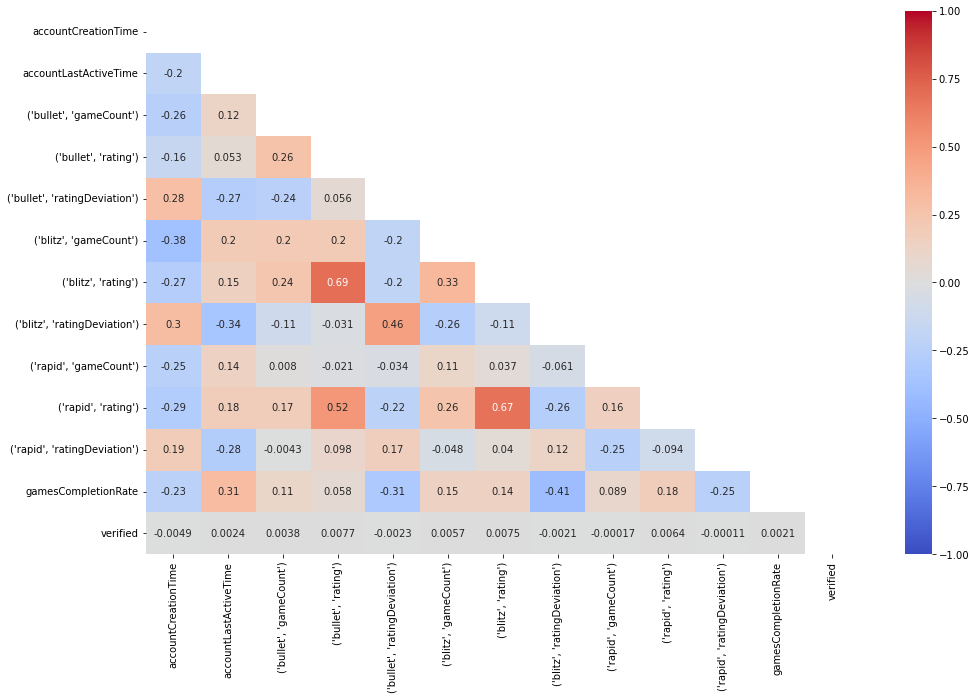

In [13]:
%matplotlib inline
plt.figure(figsize=(16, 10))
#Create a lower triangle matrix
# define the mask to set the values in the upper triangle to True
mask = np.triu(np.ones_like(corr_mat, dtype=bool))
sns.heatmap(corr_mat,vmin=-1, vmax=1, mask = mask,annot=True, cmap = 'coolwarm')

No significant correlation was found between features.

Only moderate correlations were found between the ratings for the different time controls, which is to be expected (above a certain rating range, it is considered that the player's strength isn't diminished from a shorter time control).

A moderate correlation was found between the rating deviation for blitz and bullet, which is also to be expected (they are two most commonly played time controls, and games are relatively short, so it's likely a player would play both time controls, but it looks like most players either play only bullet or blitz for a period of time).

No correlation was found between rating and number of games for all time controls (you don't get better at chess just by playing more games).

No correlation was found between age of account and number of games for all time controls (the most active players aren't necessarily the ones that have played for the longest time).

### Descriptive statistics for all features

In [14]:
desc_stats = None

for feature in active_users_df.columns:
    #Skip categorical features
    if feature in ['username','title','verified']:
        continue
    #Treat datetime features as numeric to get stats
    if feature in ['accountCreationTime','accountLastActiveTime']:
        feature_stats = active_users_df[feature].describe(datetime_is_numeric=True)
    else:
        feature_stats = active_users_df[feature].describe()
    #Concat to df if it exists, else set first feature to df
    if desc_stats is None:
        desc_stats = feature_stats
    else:
        desc_stats = pd.concat([desc_stats,feature_stats],axis=1)
#Transpose and drop the 'count' stat
desc_stats = desc_stats.T.drop(columns = ['count'])
desc_stats

,mean,min,25%,50%,75%,max,std
accountCreationTime,2020-08-15 09:03:29.154962176,2010-11-22 10:16:04,2020-03-20 13:15:01.504499968,2021-01-13 09:17:27.958000128,2021-09-26 17:48:52.198500096,2022-01-31 23:47:36.348000,NaN
accountLastActiveTime,2022-03-03 06:17:53.476554240,2021-10-13 12:50:44.117000,2022-02-22 18:48:45.591250176,2022-03-14 17:15:04.497500160,2022-03-17 14:20:17.858249984,2022-03-21 15:28:31.509000,NaN
"(bullet, gameCount)",744.778602,0.0,0.0,9.0,200.0,168220.0,3192.839847
"(bullet, rating)",1387.054943,600.0,1154.0,1463.0,1500.0,3252.0,335.44002
"(bullet, ratingDeviation)",231.585576,45.0,76.0,161.0,500.0,500.0,176.621976
"(blitz, gameCount)",1036.599342,0.0,10.0,136.0,904.0,108187.0,2565.348428
"(blitz, rating)",1453.203498,600.0,1178.0,1468.0,1690.0,3214.0,380.738519
"(blitz, ratingDeviation)",139.659412,45.0,52.0,82.0,153.0,500.0,135.570101
"(rapid, gameCount)",290.649333,0.0,3.0,34.0,213.0,79908.0,911.174271
"(rapid, rating)",1519.274018,600.0,1306.0,1500.0,1730.0,3195.0,337.673983


### Cumulative Distribution Functions (CDFs) and Power Distribution Functions (PDFs)

#### Datetime features

##### Number of accounts created per month

In [15]:
%matplotlib inline

actGrouped = active_users_df['accountCreationTime'].groupby(active_users_df['accountCreationTime'].dt.to_period("M")).count()
actGrouped.index.names = ['Year-Month']

def plot_as_time_series(df,count_scale = 'linear'):
    plt.figure(figsize=(16, 10))
    ax = df.plot(x_compat=True)
    plt.yscale(count_scale)

    years = mdates.YearLocator()   # every year
    months = mdates.MonthLocator()  # every month
    years_fmt = mdates.DateFormatter('%Y')
    months_fmt = mdates.DateFormatter('%b')

    # format the ticks
    ax.xaxis.set_major_locator(years)
    ax.xaxis.set_major_formatter(years_fmt)
    ax.xaxis.set_minor_locator(months)
    ax.xaxis.set_minor_formatter(months_fmt)
    
    #rotate and resize ticks
    ax.tick_params(axis="x", which="both", rotation=45)
    ax.tick_params(axis='both', which='major', labelsize=8, pad = 10)
    ax.tick_params(axis='both', which='minor', labelsize=5)
    
    #Set title and grid
    plt.title('Number of Accounts (' + count_scale + ') by Creation Time (per month)')
    plt.grid(visible = True, linestyle = '-')
    plt.grid(visible = True, which = 'minor', axis = 'x', linestyle = '--')
    
    plt.show()

sub_tab=[widgets.Output() for i in range(3)]
tab = widgets.Tab()

tab.set_title(0,"Time Series (linear)")
with sub_tab[0]:
    plot_as_time_series(actGrouped,'linear')
tab.set_title(1,"Time Series (log)")
with sub_tab[1]:
    plot_as_time_series(actGrouped,'log')

actMatrix = actGrouped.copy()
actMatrix.index = [actMatrix.index.strftime('%Y'), actMatrix.index.strftime('%b')]
actMatrix.index.names = ['Year','Month']
actMatrix = actMatrix.reset_index(level='Month')
actMatrix = actMatrix.pivot_table(values='accountCreationTime', 
                                  index=actMatrix.index,
                                  columns='Month', aggfunc='first').fillna(0).astype(int)

#Sort months by right order
actMatrix = actMatrix[sorted(actMatrix.columns, key=lambda m: datetime.strptime(m, "%b"))]

tab.set_title(2,"Heatmap")
with sub_tab[2]:
    plt.figure(figsize=(16, 10))
    ax = sns.heatmap(actMatrix.T,annot=True, fmt='g', norm=LogNorm(),cmap = 'Blues').set(title='Account Creation Time (Heatmap)')
    plt.show()

tab.children = sub_tab
display(tab)

##### Number of accounts that were last active per month

In [16]:
%matplotlib inline
actGrouped = active_users_df['accountLastActiveTime'].groupby(active_users_df['accountLastActiveTime'].dt.to_period("M")).count()
actGrouped.index.names = ['Year-Month']

def plot_as_time_series(df,count_scale = 'linear'):
    plt.figure(figsize=(16, 10))
    ax = df.plot(x_compat=True)
    plt.yscale(count_scale)

    years = mdates.YearLocator()   # every year
    months = mdates.MonthLocator()  # every month
    years_fmt = mdates.DateFormatter('%Y')
    months_fmt = mdates.DateFormatter('%b')

    # format the ticks
    ax.xaxis.set_major_locator(years)
    ax.xaxis.set_major_formatter(years_fmt)
    ax.xaxis.set_minor_locator(months)
    ax.xaxis.set_minor_formatter(months_fmt)
    
    #rotate and resize ticks
    ax.tick_params(axis="x", which="both", rotation=45)
    ax.tick_params(axis='both', which='major', labelsize=10)
    ax.tick_params(axis='both', which='minor', labelsize=10)
    
    #Set title and grid
    plt.title('Number of Accounts (' + count_scale + ') by Last Active Time (per month)')
    plt.grid(visible = True, linestyle = '--')
    plt.grid(visible = True, which = 'minor', axis = 'x', linestyle = '--')
    
    plt.show()

sub_tab=[widgets.Output() for i in range(3)]
tab = widgets.Tab()

tab.set_title(0,"Time Series (linear)")
with sub_tab[0]:
    plot_as_time_series(actGrouped,'linear')
tab.set_title(1,"Time Series (log)")
with sub_tab[1]:
    plot_as_time_series(actGrouped,'log')

actMatrix = actGrouped.copy()
actMatrix.index = [actMatrix.index.strftime('%Y'), actMatrix.index.strftime('%b')]
actMatrix.index.names = ['Year','Month']
actMatrix = actMatrix.reset_index(level='Month')
actMatrix = actMatrix.pivot_table(values='accountLastActiveTime', 
                                  index=actMatrix.index,
                                  columns='Month', aggfunc='first').fillna(0).astype(int)

#Sort months by right order
actMatrix = actMatrix[sorted(actMatrix.columns, key=lambda m: datetime.strptime(m, "%b"))]

tab.set_title(2,"Heatmap")
with sub_tab[2]:
    plt.figure(figsize=(16, 10))
    ax = sns.heatmap(actMatrix.T,
                     annot=True, 
                     fmt='g', norm=LogNorm(),cmap = 'Blues').set(title='Account Last Active Time  (Heatmap)')
    plt.show()

tab.children = sub_tab
display(tab)

#### Numeric features

##### Number of games played

In [17]:
%matplotlib inline
#Transform data for boxplot
gameCount_df =pd.melt(active_users_df[[('bullet', 'gameCount'),('blitz', 'gameCount'),('rapid', 'gameCount')]])
gameCount_df['variable'] = gameCount_df['variable'].apply(lambda x: x[0])
#PDFs - Unused
# for tc in ['bullet','blitz','rapid']:
#     sns.displot(active_users_df[(tc, 'gameCount')],
#                 kind='kde',
#                 height = 10, aspect = 1.6, cut=0)
#     plt.show()

def plot_as_boxplot(df,count_scale = 'linear'):
    plt.figure(figsize=(16, 10))
    ax = sns.boxplot(x="variable", y="value", data=df)
    ax.set(xlabel='Time Control', ylabel='Number of Games Played')
    #Set major and minor ticks on y-axis
    plt.yscale(count_scale)
    if count_scale == 'linear':
        ax.yaxis.set_major_locator(MultipleLocator(10000))
        ax.yaxis.set_minor_locator(MultipleLocator(1000))
        ax.tick_params(axis='y', which='both', left=True)
    #Set title and grid
    plt.title('Number of games played ('+count_scale+') per Time control (Boxplot)')
    plt.grid(visible = True, which = 'major', axis = 'y', linestyle = '-')
    plt.tight_layout()
    plt.show()

tab = widgets.Tab()
sub_tab=[widgets.Output() for i in range(5)]
tab.set_title(0,"Boxplot (log)")
with sub_tab[0]:
    plot_as_boxplot(gameCount_df,'log')

tab.set_title(1,"Boxplot (linear)")
with sub_tab[1]:
    plot_as_boxplot(gameCount_df,'linear')

#CDFs
for i, tc in enumerate(['bullet','blitz','rapid']):
    tab.set_title(i+2,'CDF ('+tc+')')
    with sub_tab[i+2]:
        plt.figure(figsize=(16, 10))
        ax = sns.ecdfplot(active_users_df[(tc, 'gameCount')])
        ax.set(xlabel='Time Control: '+tc)
        #Set x-axis range to tighter value
        plt.xlim(-1000,plt.xlim()[1])
        #Set major and minor ticks
        ax.yaxis.set_major_locator(MultipleLocator(0.1))
        ax.yaxis.set_minor_locator(MultipleLocator(0.02))
        ax.tick_params(axis='y', which='both', left=True)
        ax.xaxis.set_major_locator(MultipleLocator(5000))
        ax.xaxis.set_minor_locator(MultipleLocator(1000))
        ax.tick_params(axis='x', which='both', bottom=True)
        ax.tick_params(axis="x", which="both", rotation=45)
        #Fill under curve
        lines = ax.lines[0]
        line1 = lines.get_xydata()[:, 0]
        line2 = lines.get_xydata()[:, 1]
        ax.fill_between(line1, line2, color="blue", alpha=0.2)
        #Set title and grid
        plt.title('Number of '+tc+' games played (CDF)')
        plt.grid(visible = True, which = 'major', axis = 'y', linestyle = '-')
        plt.grid(visible = True, which = 'minor', axis = 'y', linestyle = '--')
        plt.grid(visible = True, which = 'major', axis = 'x', linestyle = '--')
        plt.tight_layout()
        plt.show()
tab.children = sub_tab
display(tab)

There was little visual information available from the pdfs because the distributions of number of games per time control have very high peaks and very long tails which make the whole plot very large, so they weren't used. A boxplot comparing the three distributions was more interpretable, especially if the values were log scaled.

The cdfs also offer little information like the pdfs, but are slightly more interpretable.

##### Ratings

In [18]:
%matplotlib inline
tab = widgets.Tab()
sub_tab=[widgets.Output() for i in range(6)]

for i, tc in enumerate(['bullet','blitz','rapid']):
    active_non_zero_df = active_users_df[active_users_df[(tc, 'gameCount')] > 0][(tc, 'rating')]
    
    tab.set_title(i*2,tc+" (PDF)")
    with sub_tab[i*2]:
        #PDF plot
        plt.figure(figsize=(16, 10))
        ax = sns.histplot(active_non_zero_df,
                    kde=True, stat = 'frequency',zorder=3)
        ax.set(xlabel='Rating')
        #Set major and minor ticks
        ax.yaxis.set_major_locator(MultipleLocator(50))
        ax.yaxis.set_minor_locator(MultipleLocator(10))
        ax.tick_params(axis='y', which='both', left=True)
        ax.xaxis.set_major_locator(MultipleLocator(100))
        ax.xaxis.set_minor_locator(MultipleLocator(20))
        ax.tick_params(axis='x', which='both', bottom=True)
        ax.tick_params(axis="x", which="both", rotation=45)
        #Set grid
        plt.grid(visible = True, which = 'major', axis = 'y', linestyle = '-',zorder=0)
        plt.grid(visible = True, which = 'major', axis = 'x', linestyle = '-',zorder=0)
        plt.title(tc+' rating (PDF)')
        plt.tight_layout()
        plt.show()
    
    tab.set_title(i*2+1,tc+" (CDF)")
    with sub_tab[i*2+1]:
        #CDF plot
        plt.figure(figsize=(16, 10))
        ax = sns.ecdfplot(active_non_zero_df)
        ax.set(xlabel='Rating')
        #Set x-axis range to tighter value
        plt.xlim(500,plt.xlim()[1])
        # #Set major and minor ticks
        ax.yaxis.set_major_locator(MultipleLocator(0.1))
        ax.yaxis.set_minor_locator(MultipleLocator(0.02))
        ax.tick_params(axis='y', which='both', left=True)
        ax.xaxis.set_major_locator(MultipleLocator(100))
        ax.xaxis.set_minor_locator(MultipleLocator(20))
        ax.tick_params(axis='x', which='both', bottom=True)
        ax.tick_params(axis="x", which="both", rotation=45)
        #Fill under curve
        lines = ax.lines[0]
        line1 = lines.get_xydata()[:, 0]
        line2 = lines.get_xydata()[:, 1]
        ax.fill_between(line1, line2, color="blue", alpha=0.2)
        #Set title and grid
        plt.title(tc+' rating (CDF)')
        plt.grid(visible = True, which = 'major', axis = 'y', linestyle = '-')
        plt.grid(visible = True, which = 'minor', axis = 'y', linestyle = '--')
        plt.grid(visible = True, which = 'major', axis = 'x', linestyle = '--')
        plt.tight_layout()
        plt.show()
    
tab.children = sub_tab
display(tab)

All 3 time control rating ranges had an extremely high peak at 1500. This is because the starting elo is 1500 before someone plays a game in that time control, so to get a clearer picture, we remove the players that have 0 games played for the given time control (They are still have a large number of games, just not in the given time control).

There is also a small peak at the lower end of the distribution. This is because Lichess has a cut-off rating of 600, meaning losing more games while at that rating, the rating doesn't get lower.

All of the distributions look like they are a normal distribution cut-off on the lower end, which is exactly what is to be expected. If the lower bound for elo rating was 0 it would probably look exactly like a bell curve.

##### Rating deviation

In [19]:
%matplotlib inline
tab = widgets.Tab()
sub_tab=[widgets.Output() for i in range(6)]

for i, tc in enumerate(['bullet','blitz','rapid']):
    active_non_zero_df = active_users_df[active_users_df[(tc, 'gameCount')] > 0][(tc, 'ratingDeviation')]
    
    tab.set_title(i*2,tc+" (PDF)")
    with sub_tab[i*2]:
        #PDF plot
        plt.figure(figsize=(16, 10))
        ax = sns.histplot(active_non_zero_df,
                    kde=True, stat = 'percent',zorder=3)
        ax.set(xlabel='Rating Deviation')
        #Set major and minor ticks
        ax.yaxis.set_major_locator(MultipleLocator(1))
        ax.yaxis.set_minor_locator(MultipleLocator(0.25))
        ax.tick_params(axis='y', which='both', left=True)
        ax.xaxis.set_major_locator(MultipleLocator(25))
        ax.xaxis.set_minor_locator(MultipleLocator(5))
        ax.tick_params(axis='x', which='both', bottom=True)
        ax.tick_params(axis="x", which="both", rotation=45)
        #Set grid
        plt.grid(visible = True, which = 'major', axis = 'y', linestyle = '-',zorder=0)
        plt.grid(visible = True, which = 'major', axis = 'x', linestyle = '-',zorder=0)
        plt.title(tc+' rating deviation (PDF)')
        plt.tight_layout()
        plt.show()

    tab.set_title(i*2+1,tc+" (CDF)")
    with sub_tab[i*2+1]:
        #CDF plot
        plt.figure(figsize=(16, 10))
        ax = sns.ecdfplot(active_non_zero_df)
        ax.set(xlabel='Rating Deviation')
        # #Set major and minor ticks
        ax.yaxis.set_major_locator(MultipleLocator(0.1))
        ax.yaxis.set_minor_locator(MultipleLocator(0.02))
        ax.tick_params(axis='y', which='both', left=True)
        ax.xaxis.set_major_locator(MultipleLocator(25))
        ax.xaxis.set_minor_locator(MultipleLocator(5))
        ax.tick_params(axis='x', which='both', bottom=True)
        ax.tick_params(axis="x", which="both", rotation=45)
        #Fill under curve
        lines = ax.lines[0]
        line1 = lines.get_xydata()[:, 0]
        line2 = lines.get_xydata()[:, 1]
        ax.fill_between(line1, line2, color="blue", alpha=0.2)
        #Set title and grid
        plt.title(tc+' rating deviation (CDF)')
        plt.grid(visible = True, which = 'major', axis = 'y', linestyle = '-')
        plt.grid(visible = True, which = 'minor', axis = 'y', linestyle = '--')
        plt.grid(visible = True, which = 'major', axis = 'x', linestyle = '--')
        plt.tight_layout()
        plt.show()

tab.children = sub_tab
display(tab)

For the same reason as the ratings PDFs & CDFs, we remove the players that played 0 games for the given time control, as it creates a massive peak (at rd = 500).

For all time controls, the distribution looks like it is an exponential or Pareto distribution. This is to be expected as chess player activity should follow the Pareto principle.

##### Number of games completed

In [20]:
%matplotlib inline
tab = widgets.Tab()
sub_tab=[widgets.Output() for i in range(2)]

gcr_df = active_users_df[active_users_df['gamesCompletionRate']>0]['gamesCompletionRate']

tab.set_title(0,"Games Completion Rate (PDF)")
with sub_tab[0]:
    #PDF plot
    plt.figure(figsize=(16, 10))
    ax = sns.histplot(gcr_df,
                kde=True, stat = 'percent',zorder=3)
    ax.set(xlabel='Games Completion Rate')
    #Set major and minor ticks
    ax.yaxis.set_major_locator(MultipleLocator(1))
    ax.yaxis.set_minor_locator(MultipleLocator(0.25))
    ax.tick_params(axis='y', which='both', left=True)
    ax.xaxis.set_major_locator(MultipleLocator(5))
    ax.xaxis.set_minor_locator(MultipleLocator(1))
    ax.tick_params(axis='x', which='both', bottom=True)
    ax.tick_params(axis="x", which="both", rotation=45)
    #Set grid
    plt.grid(visible = True, which = 'major', axis = 'y', linestyle = '-',zorder=0)
    plt.grid(visible = True, which = 'major', axis = 'x', linestyle = '-',zorder=0)
    plt.title('Games Completion Rate (PDF)')
    plt.tight_layout()
    plt.show()

tab.set_title(1,"Games Completion Rate (CDF)")
with sub_tab[1]:
    #CDF plot
    plt.figure(figsize=(16, 10))
    ax = sns.ecdfplot(gcr_df)
    ax.set(xlabel='Games Completion Rate')
    # #Set major and minor ticks
    ax.yaxis.set_major_locator(MultipleLocator(0.1))
    ax.yaxis.set_minor_locator(MultipleLocator(0.02))
    ax.tick_params(axis='y', which='both', left=True)
    ax.xaxis.set_major_locator(MultipleLocator(5))
    ax.xaxis.set_minor_locator(MultipleLocator(1))
    ax.tick_params(axis='x', which='both', bottom=True)
    ax.tick_params(axis="x", which="both", rotation=45)
    #Fill under curve
    lines = ax.lines[0]
    line1 = lines.get_xydata()[:, 0]
    line2 = lines.get_xydata()[:, 1]
    ax.fill_between(line1, line2, color="blue", alpha=0.2)
    #Set title and grid
    plt.title('Games Completion Rate (CDF)')
    plt.grid(visible = True, which = 'major', axis = 'y', linestyle = '-')
    plt.grid(visible = True, which = 'minor', axis = 'y', linestyle = '--')
    plt.grid(visible = True, which = 'major', axis = 'x', linestyle = '--')
    plt.tight_layout()
    plt.show()

tab.children = sub_tab
display(tab)

There was a rather high amount of users that had Games Completion Rate = 0 (around 12%), even though they are among the very active users. It could be a placeholder value if it wasn't calculated, or it could actually be true. In either case, removing those players won't cause a problem, as at a certain point of choosing the final dataset we would want users with extremely high or perfect Games Completion Rate (95-100%). 

What was very curious is that there are no users with Games Completion Rate = 98 & 99. On further inspection it turns out that the variable is calculated over the last 30 losses of the player, so completion rates will go 100%, 97%, 93%, ... as 30/30=100%. 29/30=96.67% approx 97%. 28/30=93.33% approx 93%. This explains the high peaks with a constant difference between them. The very small values between the peaks probably mean that there is an increase of 1-2 % based on another metric.

It should also be said that as uncompleted games counts disconnects, failure to start, aborts, and letting time run out instead of resigning, so if we were to filter based on this feature, we could be somewhat lenient (we shouldn't exclude players just because they have a bad internet connection).

### Pairwise relationships

Plotting the relationships between all of the features would be unnecessarily complicated and disorganised.
The relationships that would be of interest should be explored.
Initially these would be between:
- 'gameCount' and 'rating' (same time control)
- 'gameCount' and 'accountCreationTime'
- 'gameCount' and 'gamesCompletionRate'
- 'rating' and 'accountCreationTime'
- 'rating' and 'gamesCompletionRate'
- 'gameCount' and 'gameCount' (different time controls)
- 'rating' and 'rating' (different time controls)

#### Rating & Number of Games Played (same time control)

In [21]:
%matplotlib inline
tab = widgets.Tab()
sub_tab=[widgets.Output() for i in range(3)]

for i, tc in enumerate(['bullet','blitz','rapid']):
    non_zero_users_df = active_users_df[active_users_df[(tc, 'gameCount')]>0]
    tab.set_title(i,tc)
    with sub_tab[i]:
        fig = plt.figure(figsize=(16, 10))
        ax = sns.scatterplot(data = non_zero_users_df[[(tc, 'rating'),(tc, 'gameCount')]],
                        x = (tc, 'rating'), y = (tc, 'gameCount'),
                        s = 25, alpha = 0.5)
        #Set labels for axis
        ax.set(xlabel='Rating')
        ax.set(ylabel='Number of games')
        plt.title('Rating & Number of games ('+tc+')')
        #Set axis range to tighter value
        plt.ylim(0,plt.ylim()[1])
        plt.xlim(600,plt.xlim()[1])
        #Set major and minor ticks
        ax.yaxis.set_major_locator(MultipleLocator(5000))
        ax.yaxis.set_minor_locator(MultipleLocator(1000))
        ax.tick_params(axis='y', which='both', left=True)
        ax.tick_params(axis="y", which="both", rotation=45)
        ax.xaxis.set_major_locator(MultipleLocator(100))
        ax.xaxis.set_minor_locator(MultipleLocator(20))
        ax.tick_params(axis='x', which='both', bottom=True)
        ax.tick_params(axis="x", which="both", rotation=45)
        #Set grid
        plt.grid(visible = True, which = 'major', axis = 'y', linestyle = '--',zorder=0)
        plt.grid(visible = True, which = 'major', axis = 'x', linestyle = '--',zorder=0)
        plt.tight_layout()
        plt.show()

tab.children = sub_tab
display(tab)

#### Account Creation Time & Number of Games Played (given time control)

In [22]:
%matplotlib inline
tab = widgets.Tab()
sub_tab=[widgets.Output() for i in range(3)]
    
for i, tc in enumerate(['bullet','blitz','rapid']):
    non_zero_users_df = active_users_df[active_users_df[(tc, 'gameCount')]>0]
    tab.set_title(i,tc)
    with sub_tab[i]:
        plt.figure(figsize=(16, 10))
        ax = sns.scatterplot(data = non_zero_users_df,
                        x = 'accountCreationTime', y = (tc, 'gameCount'),
                        s = 25, alpha = 0.5)
        #Set labels for axis
        ax.set(xlabel='Account Creation Time')
        ax.set(ylabel='Number of games')
        plt.title('Account Creation Time & Number of games ('+tc+')')
        #Set axis range to tighter value
        plt.ylim(0,plt.ylim()[1])
        plt.xlim(non_zero_users_df['accountCreationTime'].min(),non_zero_users_df['accountCreationTime'].max())
        #Set major and minor ticks
        ax.yaxis.set_major_locator(MultipleLocator(5000))
        ax.yaxis.set_minor_locator(MultipleLocator(1000))
        ax.tick_params(axis='y', which='both', left=True)
        ax.tick_params(axis="y", which="both", rotation=45)
        years = mdates.YearLocator()   # every year
        months = mdates.MonthLocator()  # every month
        years_fmt = mdates.DateFormatter('%Y')
        months_fmt = mdates.DateFormatter('%b')
        # format the ticks
        ax.xaxis.set_major_locator(years)
        ax.xaxis.set_major_formatter(years_fmt)
        ax.xaxis.set_minor_locator(months)
        ax.xaxis.set_minor_formatter(months_fmt)
        ax.tick_params(axis='x', which='both', left=True)
        ax.tick_params(axis="x", which="both", rotation=45)
        ax.tick_params(axis='x', which='major', labelsize=8, pad = 10)
        ax.tick_params(axis='x', which='minor', labelsize=5)
        #Set grid
        plt.grid(visible = True, which = 'major', axis = 'y', linestyle = '-')
        plt.grid(visible = True, which = 'major', axis = 'x', linestyle = '-')
        plt.grid(visible = True, which = 'minor', axis = 'x', linestyle = '--')
        plt.tight_layout()
        plt.show()

tab.children = sub_tab
display(tab)

#### Games Completion Rate & Number of Games Played (given time control)

In [23]:
%matplotlib inline
tab = widgets.Tab()
sub_tab=[widgets.Output() for i in range(3)]
    
for i, tc in enumerate(['bullet','blitz','rapid']):
    non_zero_users_df = active_users_df[active_users_df[(tc, 'gameCount')]>0]
    non_zero_users_df = non_zero_users_df[non_zero_users_df['gamesCompletionRate']>0]
    tab.set_title(i,tc)
    with sub_tab[i]:
        plt.figure(figsize=(16, 10))
        ax = sns.scatterplot(data = non_zero_users_df,
                        x = (tc, 'gameCount'), y = 'gamesCompletionRate',
                        s = 25, alpha = 0.5)
        #Set labels for axis
        ax.set(xlabel='Number of games')
        ax.set(ylabel='Games Completion Rate')
        plt.title('Games Completion Rate & Number of Games ('+tc+')')
        #Set axis range to tighter value
        plt.xlim(0,plt.xlim()[1])
        plt.ylim(0,102)
        #Set major and minor ticks
        ax.xaxis.set_major_locator(MultipleLocator(5000))
        ax.xaxis.set_minor_locator(MultipleLocator(1000))
        ax.tick_params(axis='x', which='both', left=True)
        ax.tick_params(axis="x", which="both", rotation=45)
        ax.yaxis.set_major_locator(MultipleLocator(5))
        ax.yaxis.set_minor_locator(MultipleLocator(1))
        ax.tick_params(axis='y', which='both', bottom=True)
        ax.tick_params(axis="y", which="both", rotation=45)
        #Set grid
        plt.grid(visible = True, which = 'major', axis = 'y', linestyle = '--')
        plt.grid(visible = True, which = 'major', axis = 'x', linestyle = '--')
        plt.tight_layout()
        plt.show()

tab.children = sub_tab
display(tab)

#### Account Creation Time & Rating (given time control)

In [24]:
%matplotlib inline
tab = widgets.Tab()
sub_tab=[widgets.Output() for i in range(3)]
    
for i, tc in enumerate(['bullet','blitz','rapid']):
    non_zero_users_df = active_users_df[active_users_df[(tc, 'gameCount')]>0]
    tab.set_title(i,tc)
    with sub_tab[i]:
        plt.figure(figsize=(16, 10))
        ax = sns.scatterplot(data = non_zero_users_df,
                        x = 'accountCreationTime', y = (tc, 'rating'),
                        s = 25, alpha = 0.5)
        #Set labels for axis
        ax.set(xlabel='Account Creation Time')
        ax.set(ylabel='Rating')
        plt.title('Account Creation Time & Rating ('+tc+')')
        #Set axis range to tighter value
        plt.ylim(600,plt.ylim()[1])
        plt.xlim(non_zero_users_df['accountCreationTime'].min(),non_zero_users_df['accountCreationTime'].max())
        #Set major and minor ticks
        ax.yaxis.set_major_locator(MultipleLocator(100))
        ax.yaxis.set_minor_locator(MultipleLocator(20))
        ax.tick_params(axis='y', which='both', bottom=True)
        ax.tick_params(axis="y", which="both", rotation=45)
        years = mdates.YearLocator()   # every year
        months = mdates.MonthLocator()  # every month
        years_fmt = mdates.DateFormatter('%Y')
        months_fmt = mdates.DateFormatter('%b')
        # format the ticks
        ax.xaxis.set_major_locator(years)
        ax.xaxis.set_major_formatter(years_fmt)
        ax.xaxis.set_minor_locator(months)
        ax.xaxis.set_minor_formatter(months_fmt)
        ax.tick_params(axis='x', which='both', left=True)
        ax.tick_params(axis="x", which="both", rotation=45)
        ax.tick_params(axis='x', which='major', labelsize=8, pad = 10)
        ax.tick_params(axis='x', which='minor', labelsize=5)
        #Set grid
        plt.grid(visible = True, which = 'major', axis = 'y', linestyle = '-')
        plt.grid(visible = True, which = 'major', axis = 'x', linestyle = '-')
        plt.grid(visible = True, which = 'minor', axis = 'x', linestyle = '--')
        plt.tight_layout()
        plt.show()

tab.children = sub_tab
display(tab)

#### Games Completion Rate & Rating (given time control)

In [25]:
%matplotlib inline
tab = widgets.Tab()
sub_tab=[widgets.Output() for i in range(3)]
    
for i, tc in enumerate(['bullet','blitz','rapid']):
    non_zero_users_df = active_users_df[active_users_df[(tc, 'gameCount')]>0]
    non_zero_users_df = non_zero_users_df[non_zero_users_df['gamesCompletionRate']>0]
    tab.set_title(i,tc)
    with sub_tab[i]:
        plt.figure(figsize=(16, 10))
        ax = sns.scatterplot(data = non_zero_users_df,
                        x = (tc, 'rating'), y = 'gamesCompletionRate',
                        s = 25, alpha = 0.5)
        #Set labels for axis
        ax.set(xlabel='Rating')
        ax.set(ylabel='Games Completion Rate')
        plt.title('Games Completion Rate & Rating ('+tc+')')
        #Set axis range to tighter value
        plt.xlim(600,plt.xlim()[1])
        plt.ylim(0,102)
        #Set major and minor ticks
        ax.xaxis.set_major_locator(MultipleLocator(100))
        ax.xaxis.set_minor_locator(MultipleLocator(20))
        ax.tick_params(axis='x', which='both', left=True)
        ax.tick_params(axis="x", which="both", rotation=45)
        ax.yaxis.set_major_locator(MultipleLocator(5))
        ax.yaxis.set_minor_locator(MultipleLocator(1))
        ax.tick_params(axis='y', which='both', bottom=True)
        ax.tick_params(axis="y", which="both", rotation=45)
        #Set grid
        plt.grid(visible = True, which = 'major', axis = 'y', linestyle = '--')
        plt.grid(visible = True, which = 'major', axis = 'x', linestyle = '--')
        plt.tight_layout()
        plt.show()

tab.children = sub_tab
display(tab)

#### Number of Games Played (different time controls)

In [26]:
%matplotlib inline
tab = widgets.Tab()
sub_tab=[widgets.Output() for i in range(3)]

for i, tcs in enumerate(combinations(['bullet','blitz','rapid'], 2)):
    tc_1 = tcs[0]
    tc_2 = tcs[1]
    tab.set_title(i,str(tcs))
    with sub_tab[i]:
        plt.figure(figsize=(16, 10))
        ax = sns.scatterplot(data = active_users_df,
                        x = (tc_1, 'gameCount'), y = (tc_2, 'gameCount'),
                        s = 25, alpha = 0.5)
        #Set labels for axis
        ax.set(xlabel='Number of games ('+tc_1+')')
        ax.set(ylabel='Number of games ('+tc_2+')')
        plt.title('Number of games ('+tc_1+') & Number of games ('+tc_2+')')
        #Set axis range to tighter value
        plt.ylim(0,plt.ylim()[1])
        plt.xlim(0,plt.xlim()[1])
        #Set major and minor ticks
        ax.yaxis.set_major_locator(MultipleLocator(5000))
        ax.yaxis.set_minor_locator(MultipleLocator(1000))
        ax.tick_params(axis='y', which='both', left=True)
        ax.tick_params(axis="y", which="both", rotation=45)
        ax.xaxis.set_major_locator(MultipleLocator(5000))
        ax.xaxis.set_minor_locator(MultipleLocator(1000))
        ax.tick_params(axis='x', which='both', bottom=True)
        ax.tick_params(axis="x", which="both", rotation=45)
        #Set grid
        plt.grid(visible = True, which = 'major', axis = 'y', linestyle = '--',zorder=0)
        plt.grid(visible = True, which = 'major', axis = 'x', linestyle = '--',zorder=0)
        plt.tight_layout()
        plt.show()

tab.children = sub_tab
display(tab)

#### Rating (different time controls)

In [27]:
%matplotlib inline
tab = widgets.Tab()
sub_tab=[widgets.Output() for i in range(3)]

for i, tcs in enumerate(combinations(['bullet','blitz','rapid'], 2)):
    tc_1 = tcs[0]
    tc_2 = tcs[1]
    tab.set_title(i,str(tcs))
    with sub_tab[i]:
        plt.figure(figsize=(16, 10))
        ax = sns.scatterplot(data = active_users_df,
                        x = (tc_1, 'rating'), y = (tc_2, 'rating'),
                        s = 25, alpha = 0.5)
        #Set labels for axis
        ax.set(xlabel='Rating ('+tc_1+')')
        ax.set(ylabel='Rating ('+tc_2+')')
        plt.title('Rating ('+tc_1+') & Rating ('+tc_2+')')
        #Set axis range to tighter value
        plt.ylim(600,plt.ylim()[1])
        plt.xlim(600,plt.xlim()[1])
        #Set major and minor ticks
        ax.yaxis.set_major_locator(MultipleLocator(100))
        ax.yaxis.set_minor_locator(MultipleLocator(20))
        ax.tick_params(axis='y', which='both', left=True)
        ax.tick_params(axis="y", which="both", rotation=45)
        ax.xaxis.set_major_locator(MultipleLocator(100))
        ax.xaxis.set_minor_locator(MultipleLocator(20))
        ax.tick_params(axis='x', which='both', bottom=True)
        ax.tick_params(axis="x", which="both", rotation=45)
        #Set grid
        plt.grid(visible = True, which = 'major', axis = 'y', linestyle = '--',zorder=0)
        plt.grid(visible = True, which = 'major', axis = 'x', linestyle = '--',zorder=0)
        plt.tight_layout()
        plt.show()

tab.children = sub_tab
display(tab)

### 3D visualization

#### Number of games played (all time controls) (log scaled)

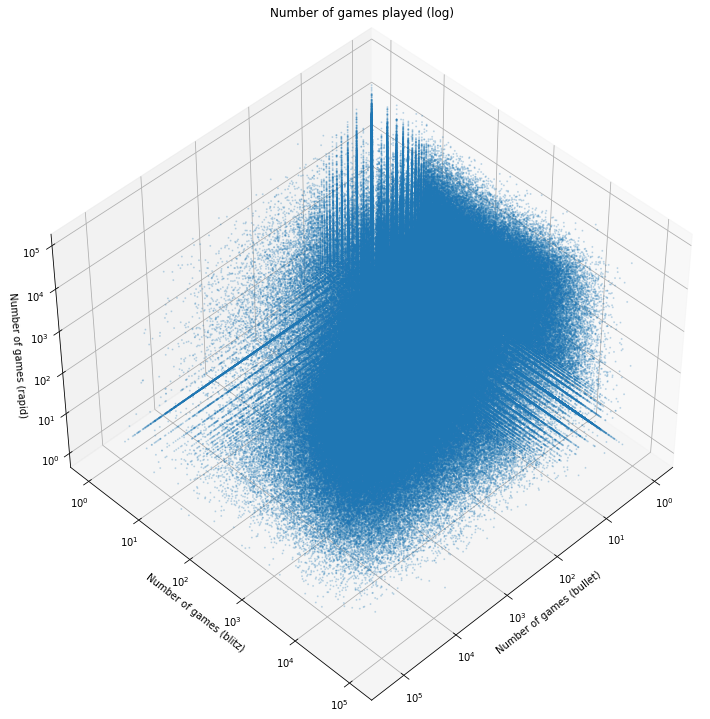

In [28]:
%matplotlib inline
def log_tick_formatter(val, pos=None):
    return r"$10^{:.0f}$".format(val)

tc_x = 'bullet'
tc_y = 'blitz'
tc_z = 'rapid'
tc_x_log = np.log10(active_users_df[(tc_x, 'gameCount')].replace(0,1))
tc_y_log = np.log10(active_users_df[(tc_y, 'gameCount')].replace(0,1))
tc_z_log = np.log10(active_users_df[(tc_z, 'gameCount')].replace(0,1))
fig = plt.figure(figsize=(16, 10))
plt.set_cmap('hot')
ax = fig.add_subplot(111, projection = '3d')
#Set labels for axis
ax.set(xlabel='Number of games ('+tc_x+')')
ax.set(ylabel='Number of games ('+tc_y+')')
ax.set(zlabel='Number of games ('+tc_z+')')
plt.title('Number of games played (log)')
#Plot 3D
ax.scatter(tc_x_log, tc_y_log, tc_z_log, s=1, alpha=0.2)
#Set major and minor ticks
ax.yaxis.set_major_formatter(FuncFormatter(log_tick_formatter))
ax.tick_params(axis='y', which='both', left=True)
ax.xaxis.set_major_formatter(FuncFormatter(log_tick_formatter))
ax.tick_params(axis='x', which='both', bottom=True)
ax.zaxis.set_major_formatter(FuncFormatter(log_tick_formatter))
ax.tick_params(axis='z', which='both', bottom=True)
#Set view
ax.view_init(45, 45)
plt.tight_layout()
plt.show()

#### Ratings (all time controls)

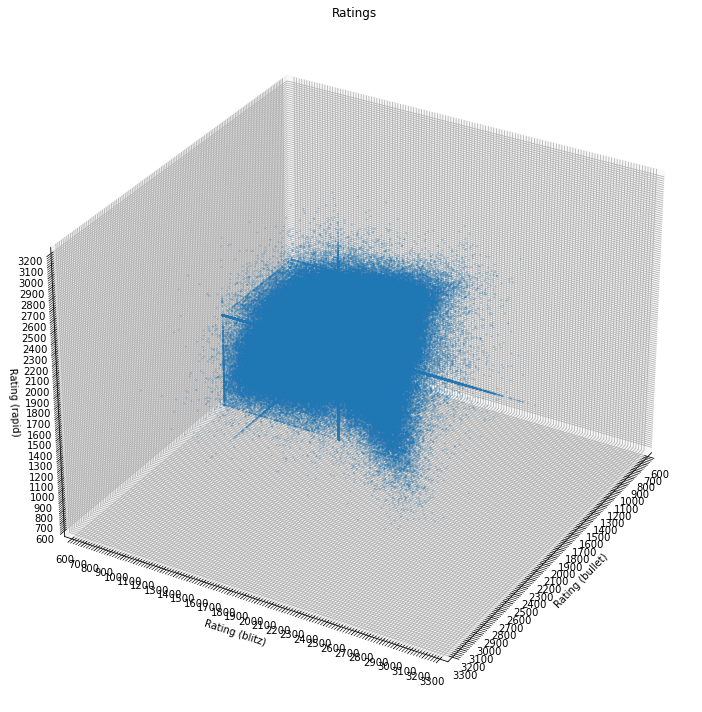

In [29]:
%matplotlib inline
tc_x = 'bullet'
tc_y = 'blitz'
tc_z = 'rapid'
fig = plt.figure(figsize=(16, 10))
plt.set_cmap('hot')
ax = fig.add_subplot(111, projection = '3d')
#Set labels for axis
ax.set(xlabel='Rating ('+tc_x+')')
ax.set(ylabel='Rating ('+tc_y+')')
ax.set(zlabel='Rating ('+tc_z+')')
plt.title('Ratings')
#Plot 3D
ax.scatter(active_users_df[(tc_x, 'rating')], 
           active_users_df[(tc_y, 'rating')],
           active_users_df[(tc_z, 'rating')],s=1,alpha=0.2)
#Set axis range to tighter values
plt.ylim(600,roundup_100(active_users_df[(tc_x, 'rating')].max()))
plt.xlim(600,roundup_100(active_users_df[(tc_y, 'rating')].max()))
ax.set_zlim(600,roundup_100(active_users_df[(tc_z, 'rating')].max()))
#Set major and minor ticks
ax.yaxis.set_major_locator(MultipleLocator(100))
ax.yaxis.set_minor_locator(MultipleLocator(20))
ax.tick_params(axis='y', which='both', left=True)
ax.xaxis.set_major_locator(MultipleLocator(100))
ax.xaxis.set_minor_locator(MultipleLocator(20))
ax.tick_params(axis='x', which='both', bottom=True)
ax.zaxis.set_major_locator(MultipleLocator(100))
ax.zaxis.set_minor_locator(MultipleLocator(20))
ax.tick_params(axis='z', which='both', bottom=True)
#Set grid
# plt.grid(visible = True, which = 'major', axis = 'y', linestyle = '--',zorder=0)
# plt.grid(visible = True, which = 'major', axis = 'x', linestyle = '--',zorder=0)
# plt.grid(visible = True, which = 'major', axis = 'z', linestyle = '--',zorder=0)
#Set view
ax.view_init(30, 30)
plt.tight_layout()
plt.show()

### Categorical features

#### Titled players

In [30]:
#Group players by title
titled_users_df = active_users_df.groupby(['title'])
tab = widgets.Tab()
sub_tab=[widgets.Output() for i in range(titled_users_df.ngroups)]

#Get titled player stats
titled_users_stats = titled_users_df.describe(datetime_is_numeric=True)
#Sort by title count
titled_users_stats = titled_users_stats.sort_values(by=[('accountCreationTime','count')],ascending = False)
i = 0
for title, row in titled_users_stats.iterrows():
    row = row.reset_index()
    row = row.pivot(values=title, index='level_0', columns='level_1')
    row.index.name = 'features'
    row.columns.name = 'stats'
    
    tab.set_title(i,title)
    with sub_tab[i]:
        display(row)
    i = i + 1

tab.children = sub_tab
display(tab)

D:\IDEs\Anaconda3\envs\chess\lib\site-packages\pandas\core\common.py:241: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  result = np.asarray(values, dtype=dtype)


For almost all of the titled players groups, the 25th percentile for games completion rate equals 90. So, it's safe to assume (since almost all titled players would be considered sportsmanlike) that this margin is because of connection issues, rather than because they left the game without resigning.

However, since the dataset is very large, it can be argued to use only perfect games completion rate as a strict condition, not to leave anything to probability.

#### Verified accounts

In [31]:
active_users_df['verified'].value_counts()

False    829355
True         11
Name: verified, dtype: int64

In [32]:
active_users_df[active_users_df['verified']]

,username,accountCreationTime,accountLastActiveTime,"(bullet, gameCount)","(bullet, rating)","(bullet, ratingDeviation)","(blitz, gameCount)","(blitz, rating)","(blitz, ratingDeviation)","(rapid, gameCount)","(rapid, rating)","(rapid, ratingDeviation)",gamesCompletionRate,title,verified
56729,Altmarkwolf,2020-03-16 21:11:56.206,2022-03-15 14:13:54.087,515,1672,93,5912,1958,45,517,1952,84,100,NaN,True
139049,Bobmoth,2020-03-25 12:50:01.682,2022-03-16 11:10:12.267,1000,2243,54,1762,2275,45,274,2410,74,90,CM,True
178083,Chessat3,2015-10-02 19:22:55.980,2022-03-16 13:48:51.185,905,1942,188,2400,1750,51,212,1902,171,100,NaN,True
180801,ChickenElephant,2020-03-19 16:23:18.809,2022-03-15 12:41:04.906,1649,2149,55,3287,2214,76,197,2369,117,97,FM,True
266564,ElMago66,2020-04-01 07:48:58.219,2022-03-16 16:02:48.500,0,1500,500,1374,1927,45,100,1915,107,97,NaN,True
267885,Elda64,2015-04-19 15:34:53.427,2022-03-17 11:04:27.622,30534,2901,48,21717,2819,45,3,2437,298,100,GM,True
378761,Hussain_QCA,2020-03-30 10:17:35.568,2022-03-15 15:55:09.655,15,1771,152,62,2496,89,0,1500,500,86,NaN,True
742160,Rookie,2020-10-15 09:21:32.829,2022-03-20 17:30:32.504,132,2455,81,402,2444,103,3,2429,297,100,IM,True
762455,SaintLouisChessClub,2018-08-30 14:24:01.780,2022-03-21 04:15:24.899,1899,2231,56,5472,2434,49,984,2266,45,97,LM,True
774210,SatrancMedyaYoutube,2017-02-24 23:13:58.030,2022-03-12 19:19:00.465,6639,2310,65,4634,2235,78,36,2027,204,93,NaN,True


Within verified accounts, we can see the SaintLouisChessClub account, which is used during streams/simultaneous exibitions by different players from that chess club, so we can safely say that this account doesn't represent a single player. As we have no way of knowing whether the other verified accounts are used in the same way or not, and since there is a small number of verified accounts that are very active, it seems acceptable to remove these users as a preprocessing step.